# Stat 301 Group 2 Project 

Yuechang Liu

## Table of Contents:
1. [Description](#Description)
2. [Cleaning](#cleaning)
3. [Visualization](#visualization)

In [3]:
# Load the Libraries
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(faux)

# set seed number for the project
seed_num <- 1111

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp



************
Welcome to faux. For support and examples visit:
https://debruine.github.io/faux/
- Get and set global package options with: faux_options()
************



kaggle Link: https://www.kaggle.com/datasets/uciml/red-wine-quality-cortez-et-al-2009

In [4]:
df <- read_csv("winequality-red.csv")

Rows: 1599 Columns: 12
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (12): fixed acidity, volatile acidity, citric acid, residual sugar, chlo...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


### 1. Description <a id='Description'></a>
The data set we selected is related to red and white variants of the Portuguese "Vinho Verde" wine. The variables are physicochemical qualities of the wine including fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density, pH,sulphates, alcohol and an associated quality score. This data was collected from red and white wine samples where physicochemical qualities were from objective tests such as a pH tests and the quality score was based on experts grading the wine quality between 0 (very bad) and 10 (very excellent).

In [5]:
# Total count of the data
count(df)

n
<int>
1599


In [6]:
# get a sense of what the data look like
head(df,10)

fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
7.4,0.70,0.00,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
7.8,0.88,0.00,2.6,0.098,25,67,0.9968,3.20,0.68,9.8,5
7.8,0.76,0.04,2.3,0.092,15,54,0.9970,3.26,0.65,9.8,5
11.2,0.28,0.56,1.9,0.075,17,60,0.9980,3.16,0.58,9.8,6
7.4,0.70,0.00,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
7.4,0.66,0.00,1.8,0.075,13,40,0.9978,3.51,0.56,9.4,5
7.9,0.60,0.06,1.6,0.069,15,59,0.9964,3.30,0.46,9.4,5
7.3,0.65,0.00,1.2,0.065,15,21,0.9946,3.39,0.47,10.0,7
7.8,0.58,0.02,2.0,0.073,9,18,0.9968,3.36,0.57,9.5,7


In [7]:
summary(df)

 fixed acidity   volatile acidity  citric acid    residual sugar  
 Min.   : 4.60   Min.   :0.1200   Min.   :0.000   Min.   : 0.900  
 1st Qu.: 7.10   1st Qu.:0.3900   1st Qu.:0.090   1st Qu.: 1.900  
 Median : 7.90   Median :0.5200   Median :0.260   Median : 2.200  
 Mean   : 8.32   Mean   :0.5278   Mean   :0.271   Mean   : 2.539  
 3rd Qu.: 9.20   3rd Qu.:0.6400   3rd Qu.:0.420   3rd Qu.: 2.600  
 Max.   :15.90   Max.   :1.5800   Max.   :1.000   Max.   :15.500  
   chlorides       free sulfur dioxide total sulfur dioxide    density      
 Min.   :0.01200   Min.   : 1.00       Min.   :  6.00       Min.   :0.9901  
 1st Qu.:0.07000   1st Qu.: 7.00       1st Qu.: 22.00       1st Qu.:0.9956  
 Median :0.07900   Median :14.00       Median : 38.00       Median :0.9968  
 Mean   :0.08747   Mean   :15.87       Mean   : 46.47       Mean   :0.9967  
 3rd Qu.:0.09000   3rd Qu.:21.00       3rd Qu.: 62.00       3rd Qu.:0.9978  
 Max.   :0.61100   Max.   :72.00       Max.   :289.00       Max.   :1

In [8]:
data.frame(sapply(df, mean))

,sapply.df..mean.
,<dbl>
fixed acidity,8.31963727
volatile acidity,0.52782051
citric acid,0.27097561
residual sugar,2.53880550
chlorides,0.08746654
free sulfur dioxide,15.87492183
total sulfur dioxide,46.46779237
density,0.99674668
pH,3.31111320


### Question: Can we predict the quality rating of red wine (response variable) based on its chemical properties such as acidity, pH level, alcohol content, and volatile acidity (explanatory variables)?

This question focuses on prediction using regression analysis. The goal is to build a regression model that can accurately predict the quality rating of red wine based on its chemical properties. By analyzing the relationship between the response variable (quality rating) and the explanatory variables (chemical properties), we can develop a predictive model that can estimate the quality rating of red wine samples not included in the dataset.

The dataset contains information about different chemical properties of red wines along with their quality ratings. By fitting a regression model to the data, we can identify the relationship between the chemical properties and the quality rating. This model can then be used to predict the quality rating of new or unseen red wine samples based on their chemical properties.

The analysis can provide insights into which chemical properties have a significant impact on the quality of red wine and how they contribute to the overall rating. Additionally, the predictive model can be used by wine producers or enthusiasts to assess the quality of red wines based on their chemical composition.

### Split the data for cleaning purpose

In [9]:
# Extract the response variable (y)
y <- df$quality

# Extract the predictor variables (X)
X <- df[, !(names(df) %in% "quality")]

# 2.Data cleaning<a id='cleaning'></a>

In [10]:
# Count the number of nulls for each column
null_counts <- colSums(is.na(df))

In [11]:
null_counts

fixed acidity     volatile acidity          citric acid 
                   0                    0                    0 
      residual sugar            chlorides  free sulfur dioxide 
                   0                    0                    0 
total sulfur dioxide              density                   pH 
                   0                    0                    0 
           sulphates              alcohol              quality 
                   0                    0                    0

In [12]:
# Find duplicate records based on all columns
duplicate_rows <- df[duplicated(df), ]

In [13]:
count(duplicate_rows)

n
<int>
240


In [14]:
# Remove duplicated rows
df_unique <- unique(df)

In [15]:
count(df_unique)

n
<int>
1359


In [16]:
#pairs(df)

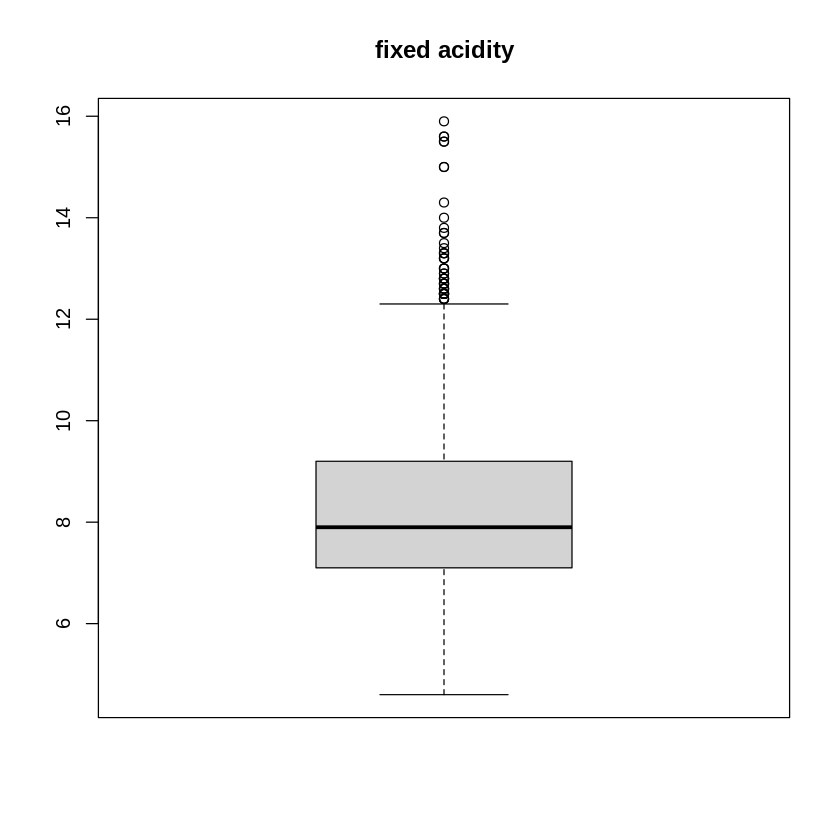

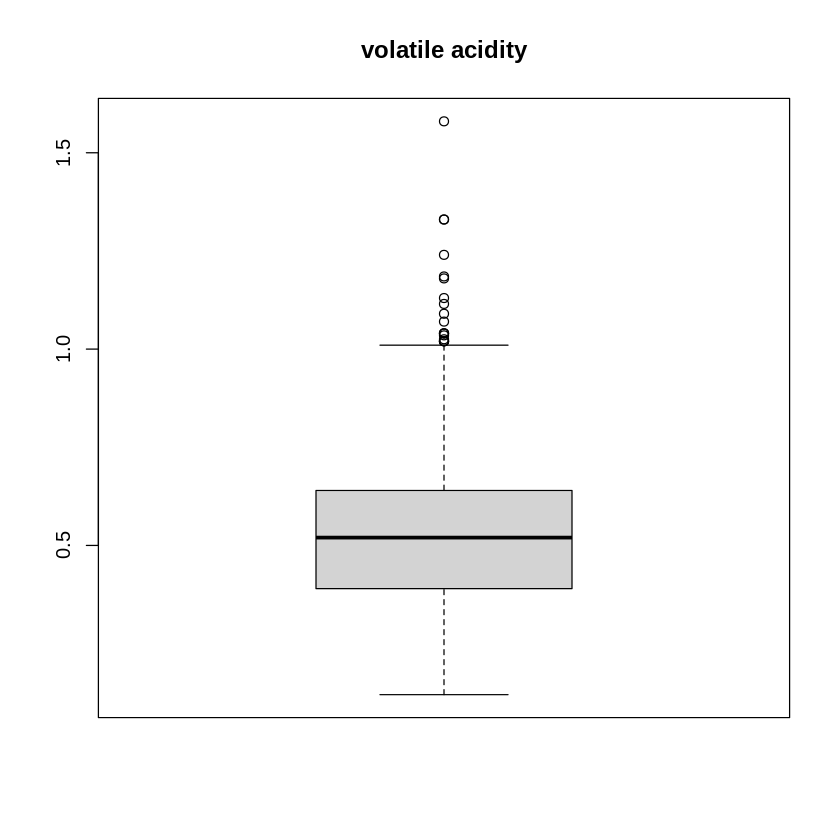

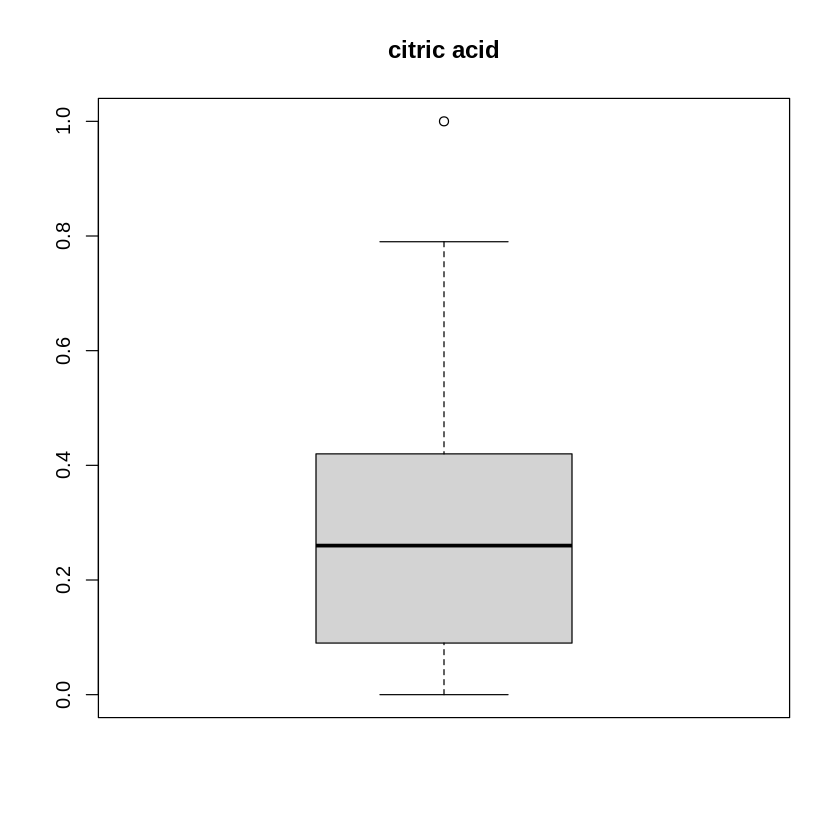

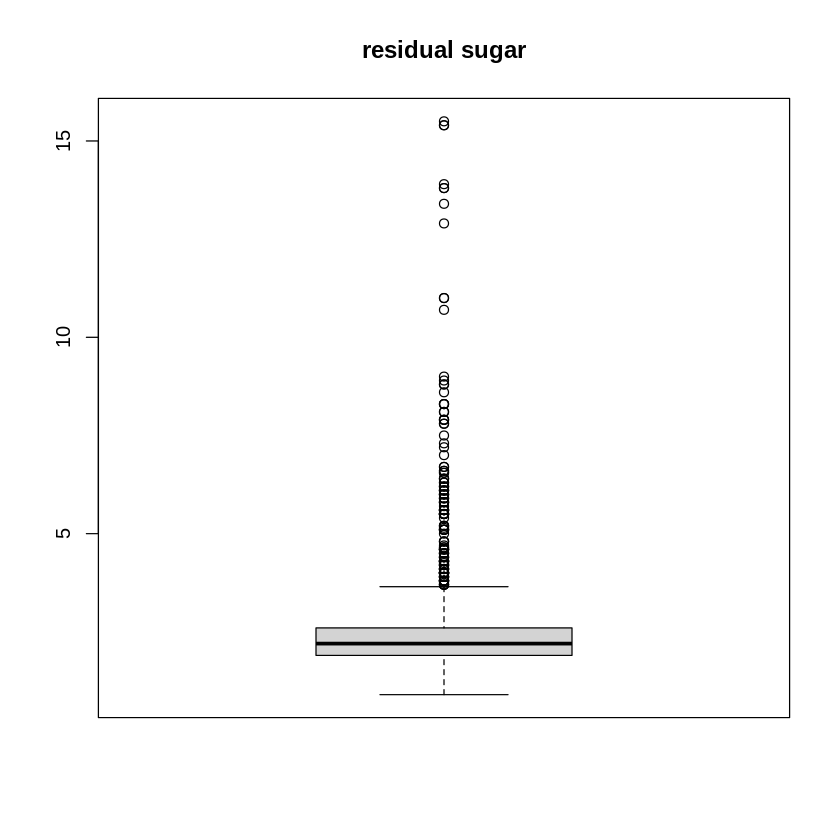

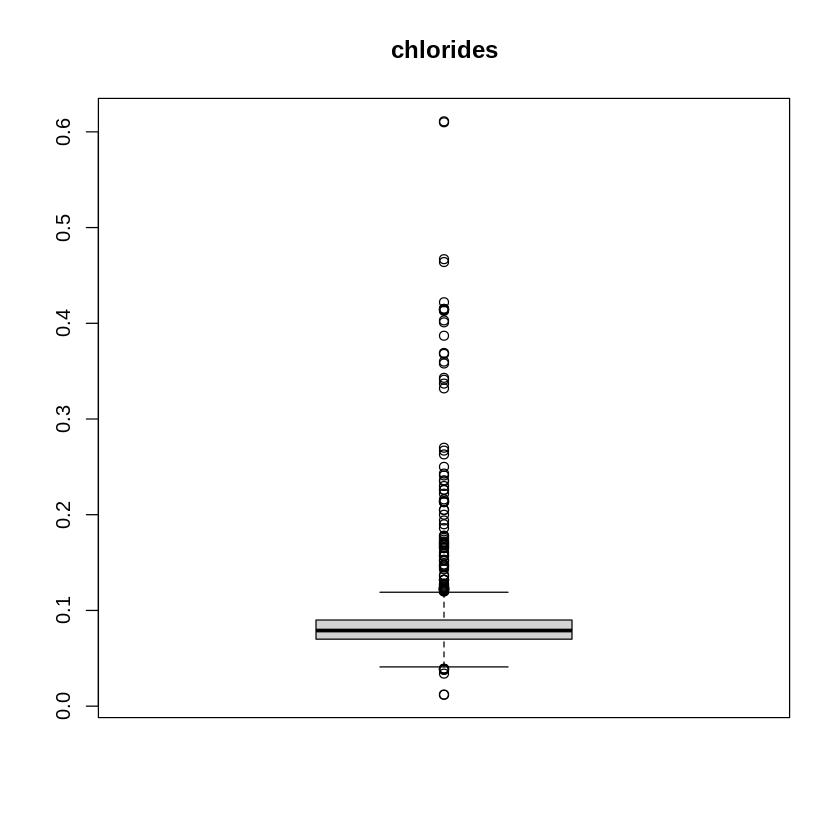

...

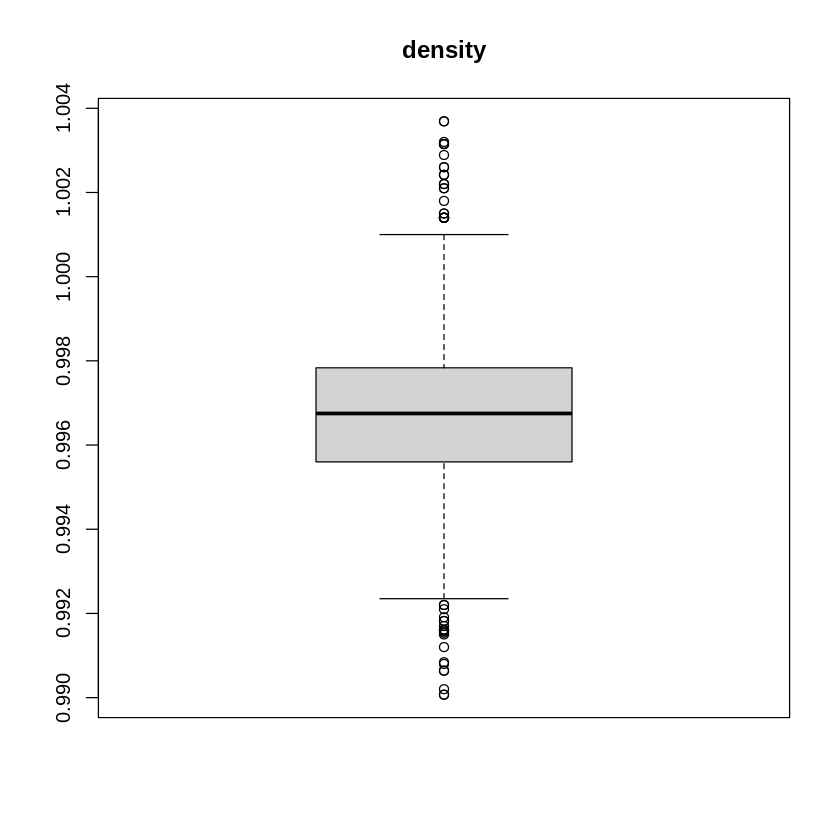

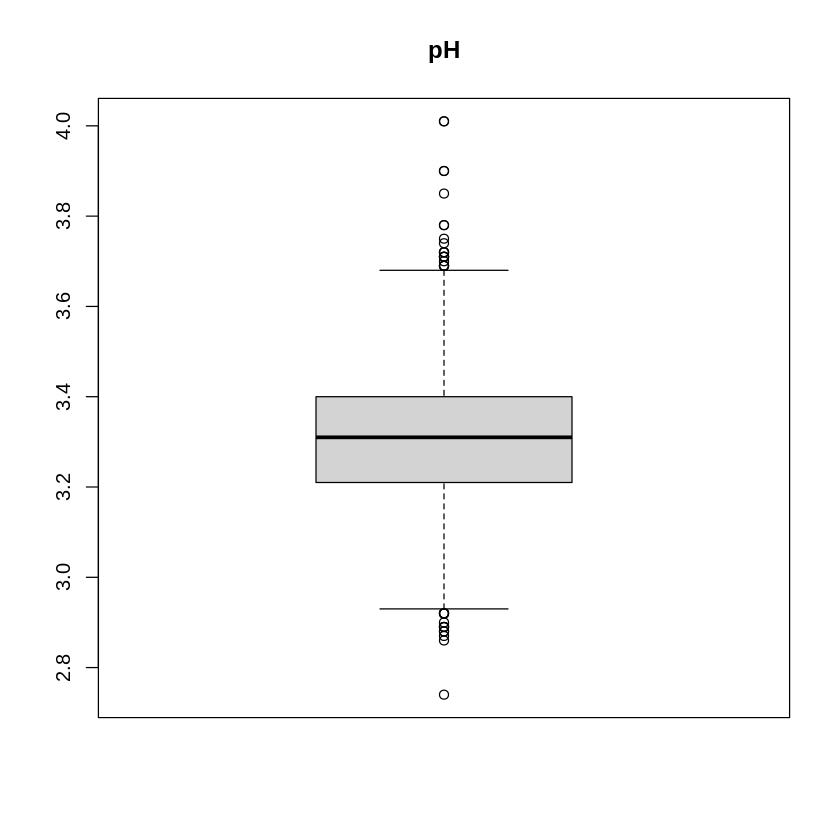

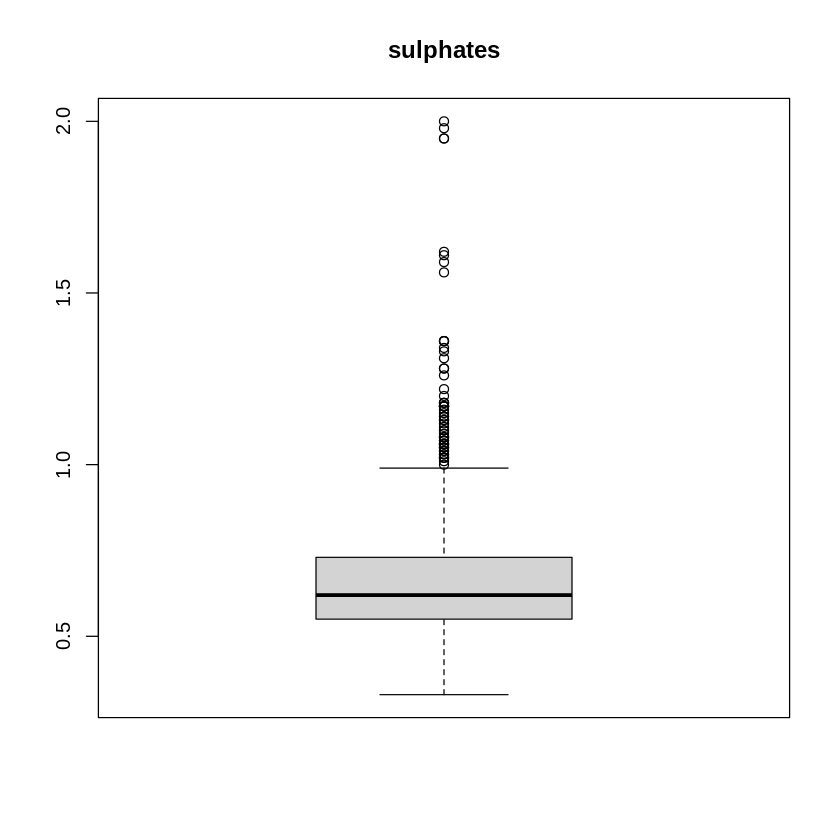

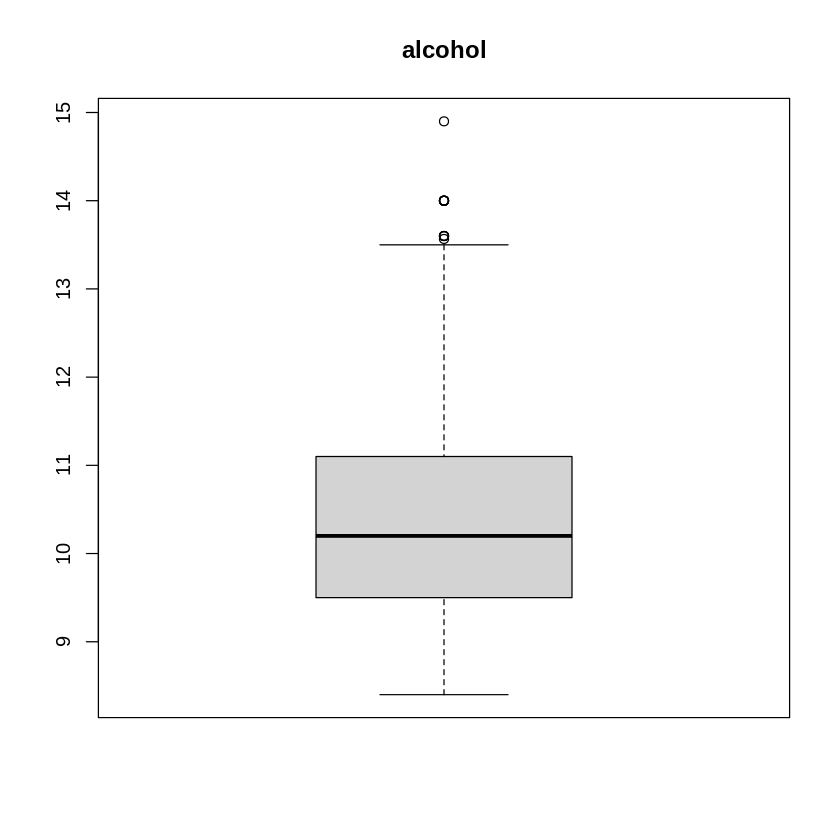

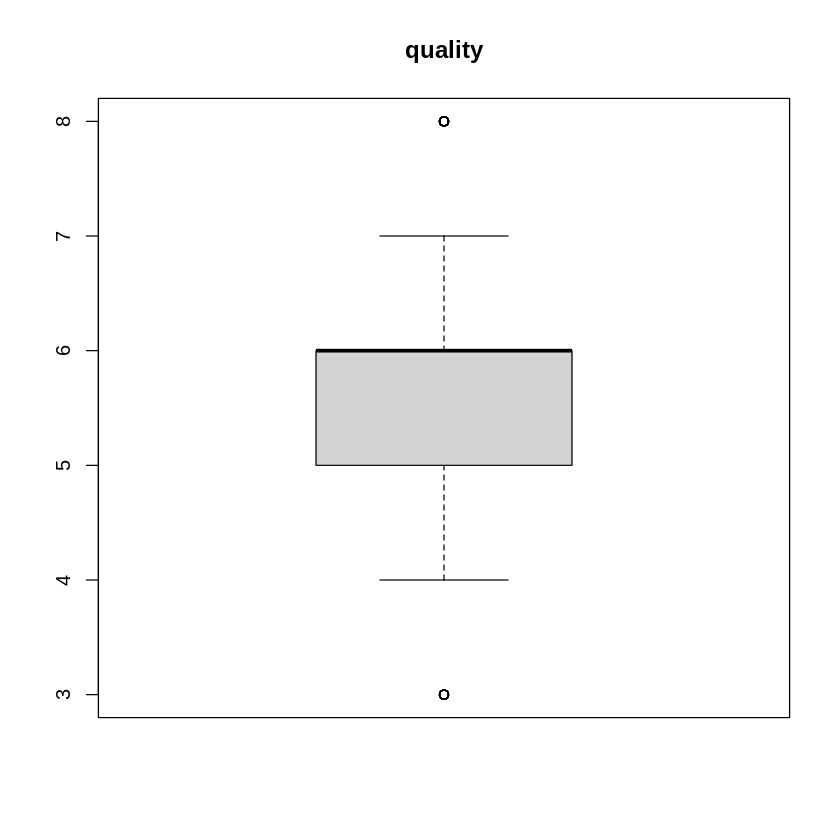

In [17]:
# Create individual box plots for each variable
for (col in colnames(df)) {
  boxplot(df[[col]], main = col)
}

In [18]:
# Define a function to find outliers using Tukey's fences
find_outliers <- function(x) {
  Q1 <- quantile(x, 0.25)
  Q3 <- quantile(x, 0.75)
  IQR <- Q3 - Q1
  lower_fence <- Q1 - 1.5 * IQR
  upper_fence <- Q3 + 1.5 * IQR
  outliers <- x[x < lower_fence | x > upper_fence]
  return(outliers)
}


In [19]:
# Apply the function to each column in the data frame
outlier_rows <- apply(X, 2, find_outliers)

In [20]:
ncol(outlier_rows)

NULL

In [21]:
# Define a function to remove outliers using Tukey's fences
remove_outliers <- function(x) {
  Q1 <- quantile(x, 0.25)
  Q3 <- quantile(x, 0.75)
  IQR <- Q3 - Q1
  lower_fence <- Q1 - 1.5 * IQR
  upper_fence <- Q3 + 1.5 * IQR
  outliers <- x < lower_fence | x > upper_fence
  x_filtered <- x[!outliers]
  return(x_filtered)
}


In [22]:
count(X)

n
<int>
1599


In [23]:
# Remove outliers from each column separately
filtered_columns <- lapply(X, remove_outliers)

In [24]:
# Find the common row indices for the filtered columns
common_rows <- Reduce(intersect, lapply(filtered_columns, function(x) seq_along(x)))

In [25]:
# Create a new data frame with filtered values
df_filtered <- data.frame(lapply(filtered_columns, `[`, common_rows))

In [26]:
count(df_filtered)

n
<int>
1444


In [27]:
# Create a sample data frame
df_m <- as.matrix(df_filtered)

In [28]:
# Find null values in df_m
null_values <- is.na(df_m)
# Count the number of null values in each column
column_null_counts <- colSums(null_values)

# Count the number of null values in each row
row_null_counts <- rowSums(null_values)

# Print the results
print(column_null_counts)
print(row_null_counts)

       fixed.acidity     volatile.acidity          citric.acid 
                   0                    0                    0 
      residual.sugar            chlorides  free.sulfur.dioxide 
                   0                    0                    0 
total.sulfur.dioxide              density                   pH 
                   0                    0                    0 
           sulphates              alcohol 
                   0                    0 
   [1] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  [38] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  [75] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [112] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [149] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [186] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [223] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

# 3. Visualization<a id='visualization'></a>

In [29]:
library(corrplot)

corrplot 0.92 loaded



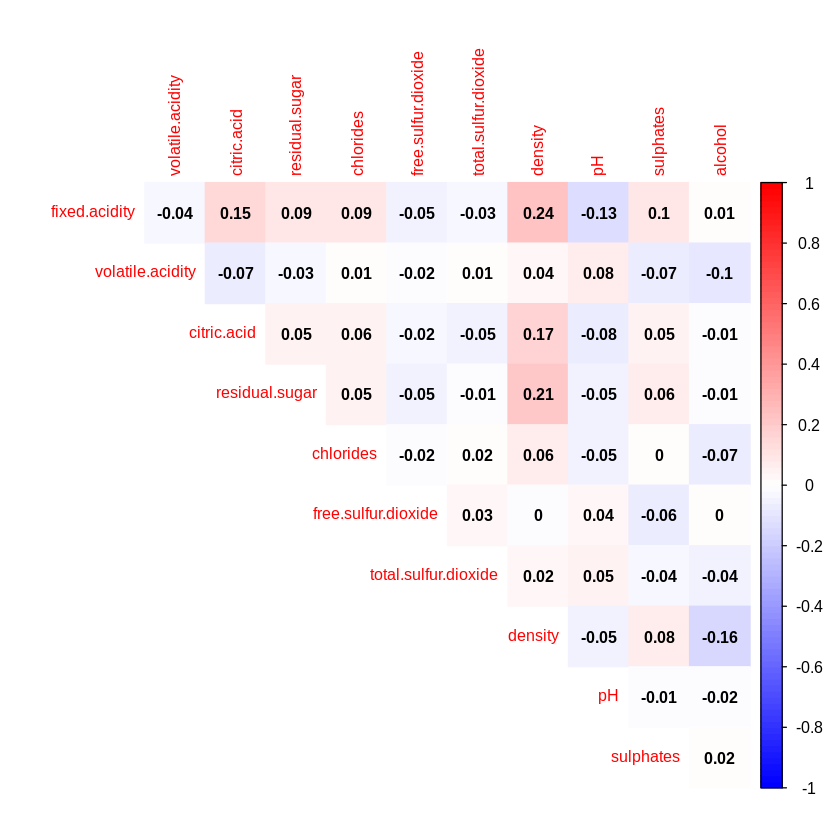

In [30]:
# Create a heatmap using the heatmap() function
corrplot(cor(df_m, method = "pearson"), 
         type = "upper",     # Show only the upper triangle of the correlation matrix
         tl.cex = 0.8,       # Adjust the size of the correlation value labels
         diag = FALSE,       # Hide the diagonal line
         method = "color",   # Color-code the correlation values
         addCoef.col = "black",  # Color of the correlation value labels
         col = colorRampPalette(c("blue", "white", "red"))(100),  # Custom color palette
         number.cex = 0.8)  # Adjust the size of the correlation value text

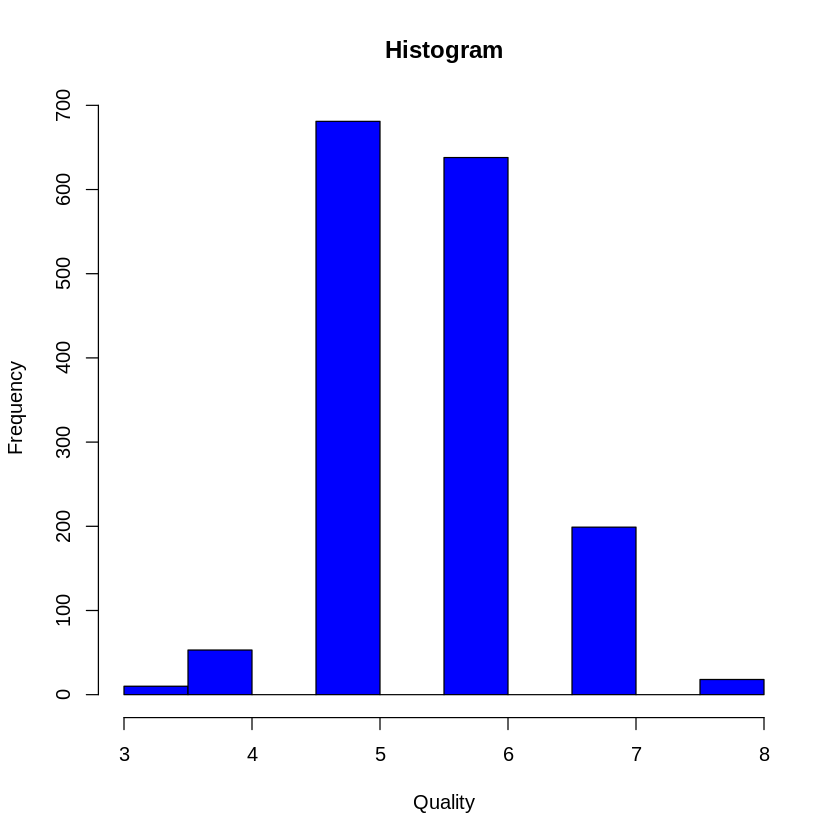

In [31]:
#print the distribution of quality
hist(y, col = "blue", main = "Histogram", xlab = "Quality")

# Proposed Combo graph

#### The provided grouped bar plots can be relevant in addressing the question of predicting the quality rating of red wine based on its chemical properties. Here's a justification for their relevance and an insightful interpretation of the visualization:

- Comparison of variable values: The grouped bar plots allow for a visual comparison of the chemical properties (explanatory variables) across different levels of the quality rating (response variable). By examining the heights of the bars within each group, we can observe how the values of acidity, pH level, alcohol content, and volatile acidity vary based on different quality ratings.

- Relationship identification: The plots help identify potential relationships between the explanatory variables and the quality rating. For example, if we observe consistent patterns in the bar heights across different quality levels, it suggests that the chemical property may have a significant influence on the quality rating. Conversely, if there is no clear distinction in the bar heights, it implies that the variable may not be strongly associated with the quality rating.

- Outlier detection: By examining the bar heights, we can identify outliers in the chemical properties for specific quality levels. Outliers may indicate unusual or extreme values that could potentially impact the quality rating. Detecting outliers can help in understanding the potential impact of specific chemical properties on the quality rating.

- Variable importance: By comparing the relative heights of the bars among the explanatory variables, we can gain insights into the relative importance of each variable in predicting the quality rating. If a particular variable consistently exhibits noticeable differences in bar heights across quality levels, it suggests that it may be a significant predictor of the quality rating.

- Exploration of relationships: The plots provide an initial exploration of the relationships between the chemical properties and the quality rating. By visually examining the bar heights and patterns, we can form initial hypotheses about which chemical properties may have a stronger influence on the quality rating and warrant further investigation.

Overall, the grouped bar plots offer a visual representation that aids in exploring the relationships between the chemical properties and the quality rating of red wine. They provide insights into potential patterns, outliers, and variable importance, which can guide further analysis and modeling efforts to predict the quality rating based on the given explanatory variables.

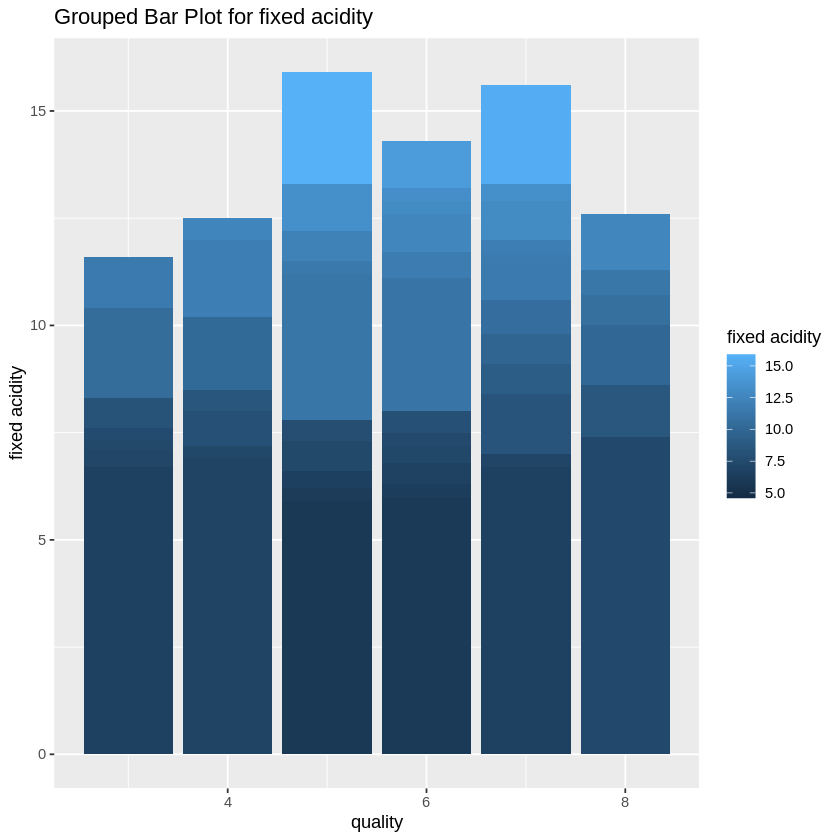

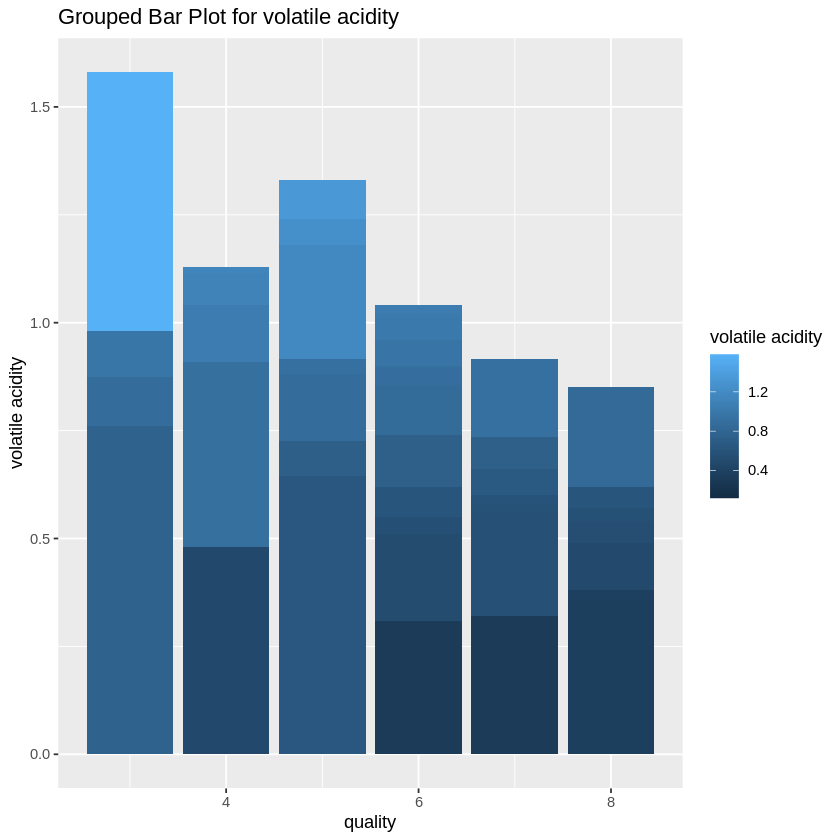

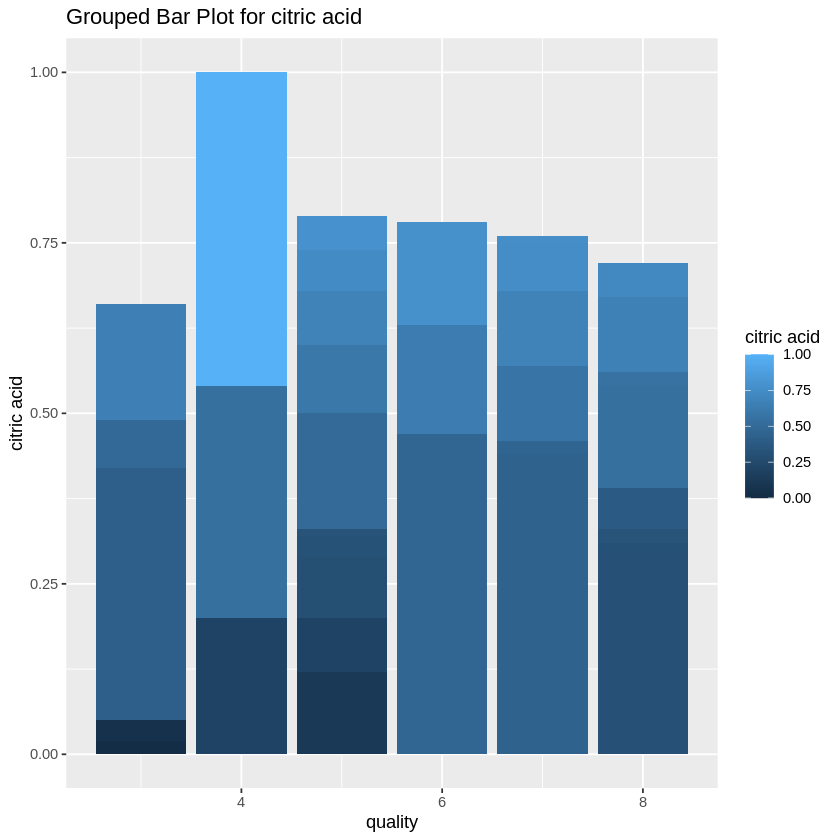

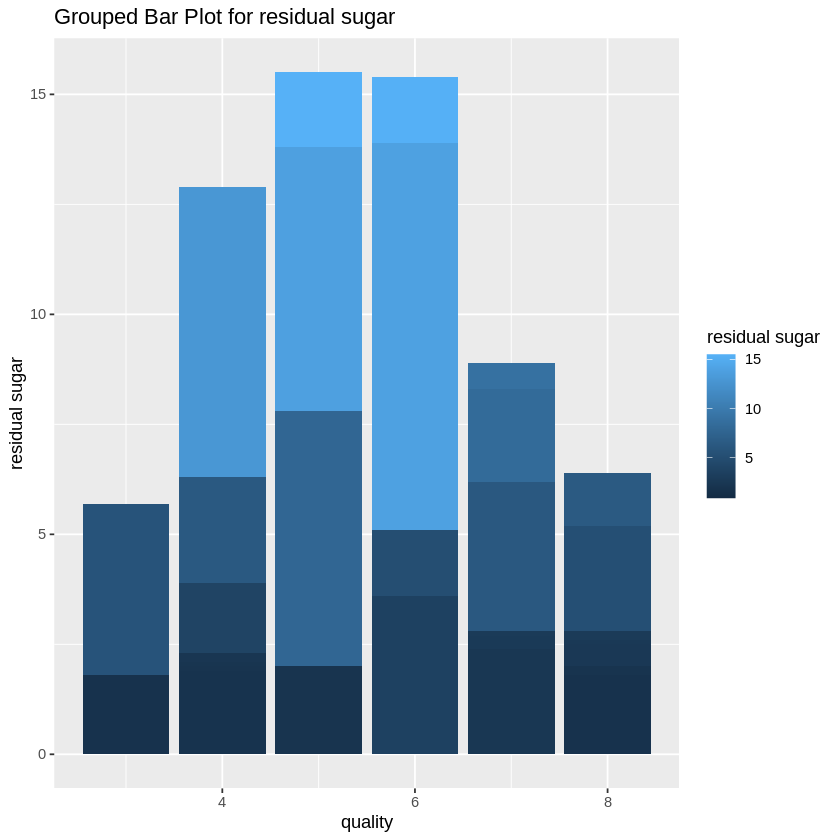

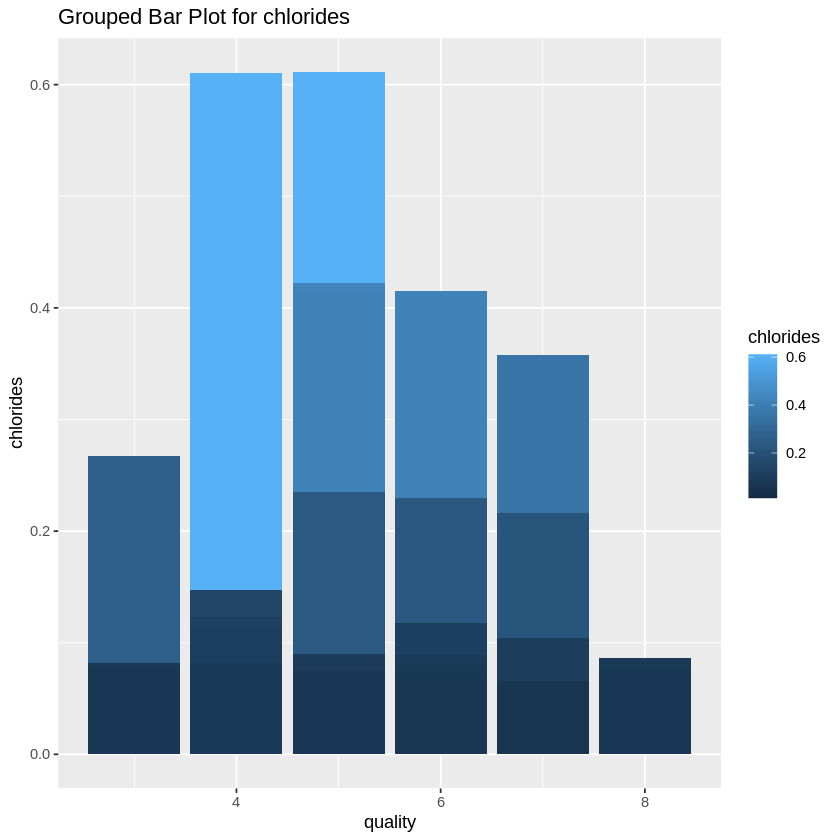

...

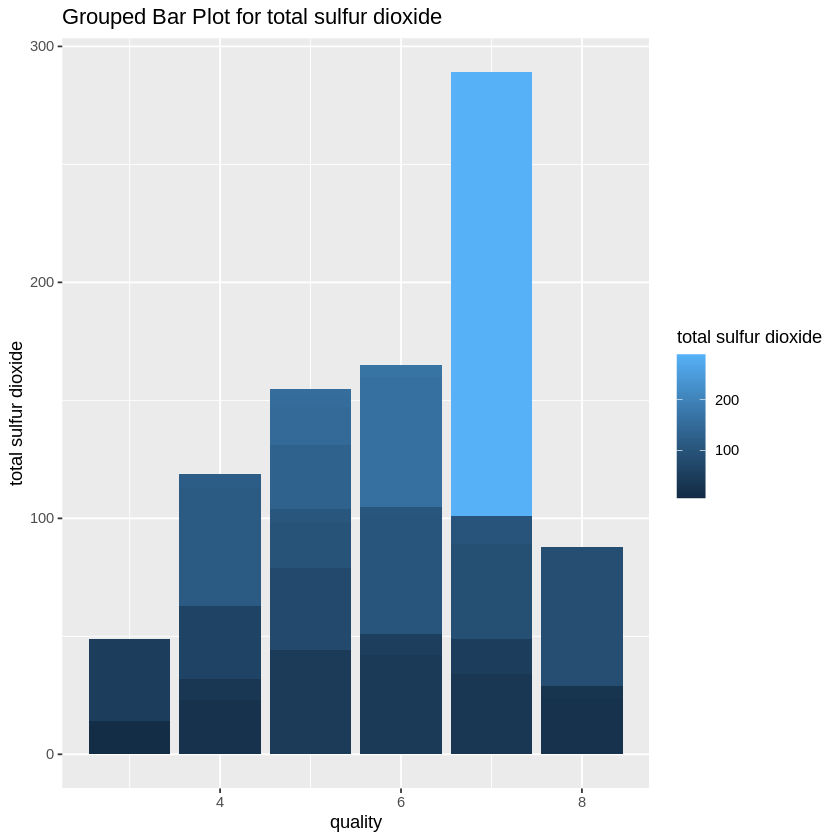

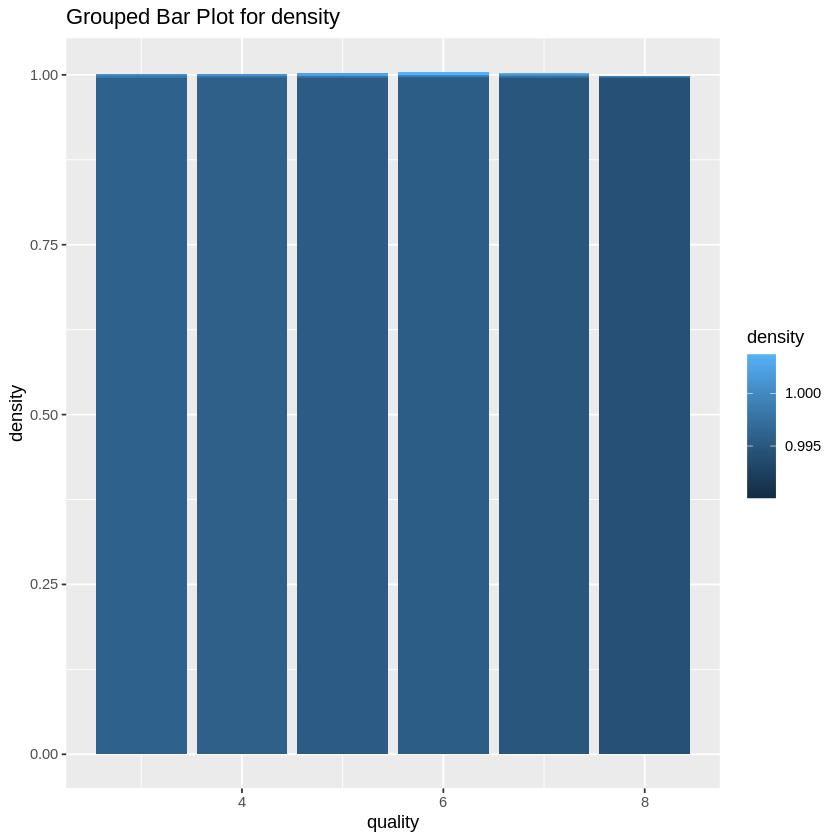

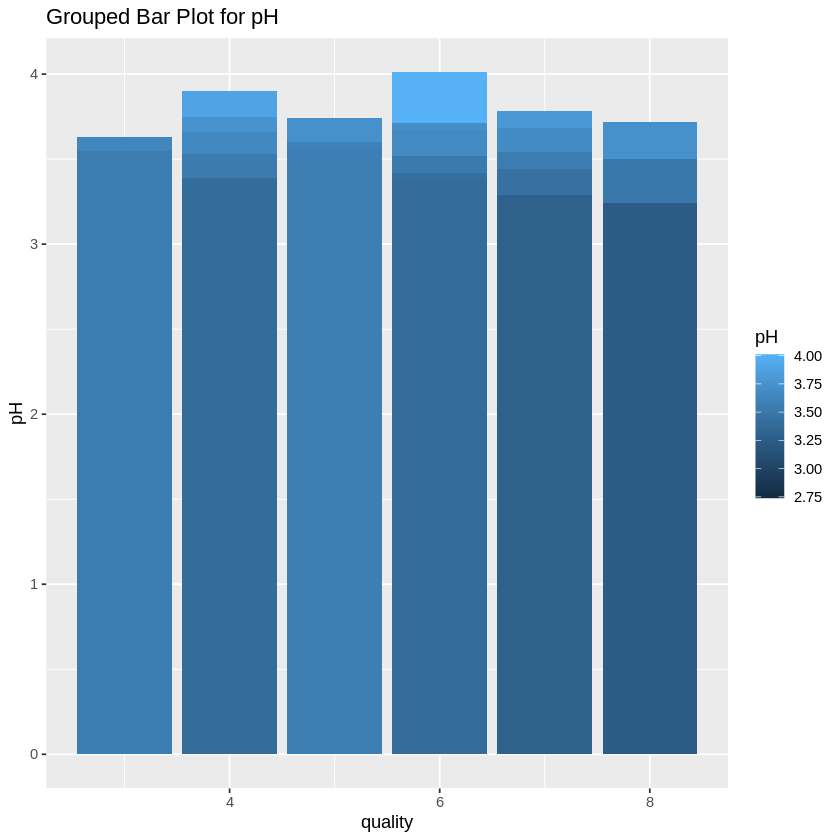

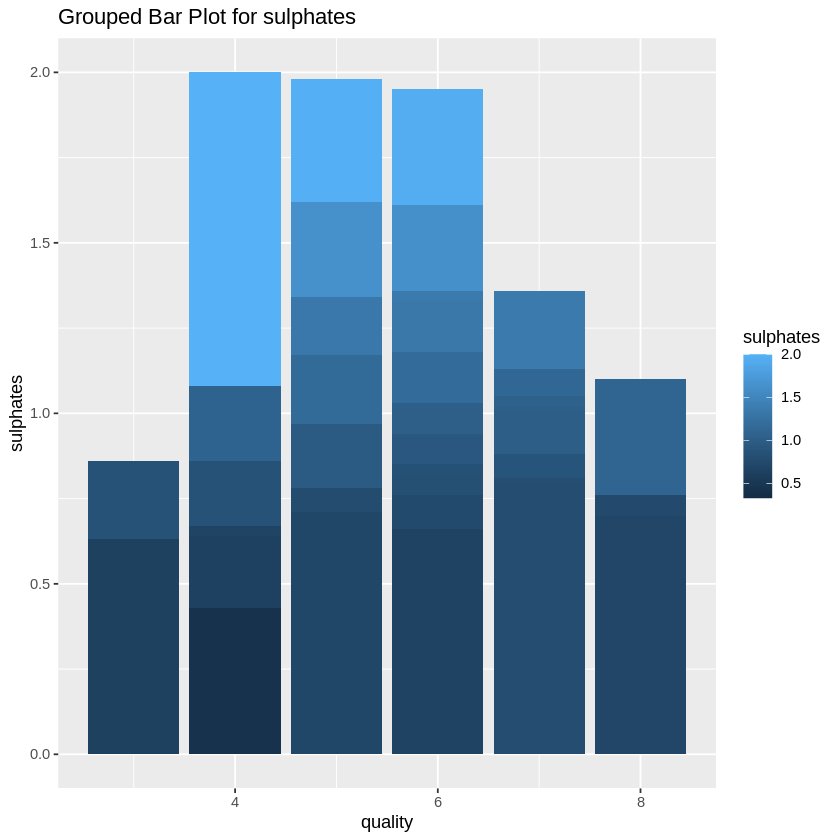

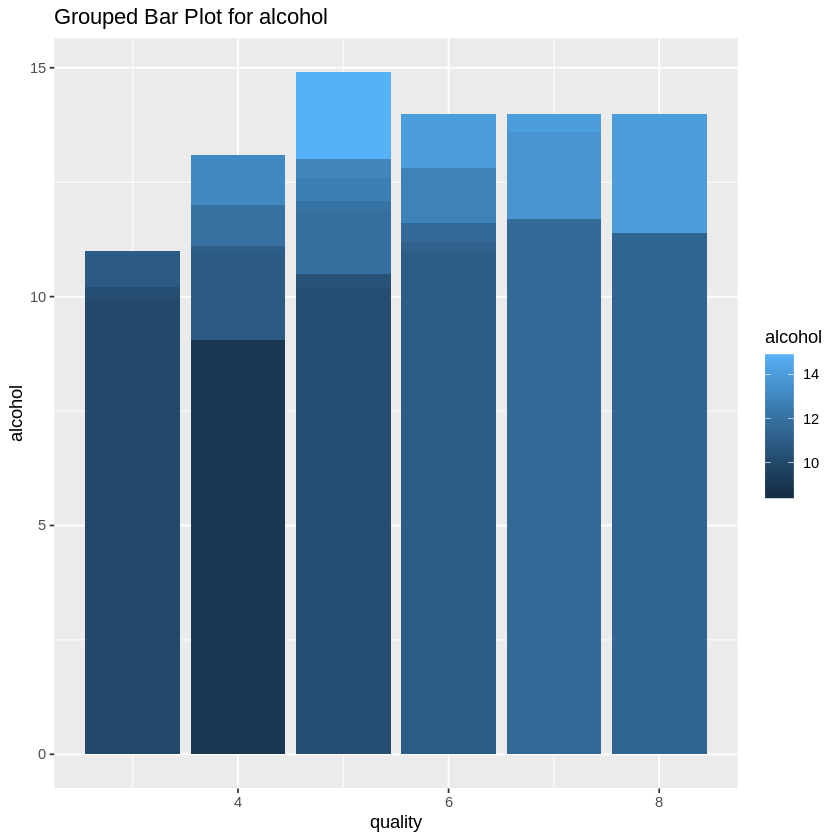

In [32]:
# Iterate through each variable in X
for (var in names(X)) {
  # Create a grouped bar plot for the current variable
  plot <- ggplot(df, aes(x = quality, y = .data[[var]], fill = .data[[var]])) +
    geom_bar(stat = "identity", position = "dodge") +
    labs(title = paste("Grouped Bar Plot for", var))
  
  # Print the plot
  print(plot)
}

### Interpretation

Comparison of variable values: we can see from the bar graphs that fixed acidity, volatile acidity, Citric acid, density, pH, and alcohol are evenly spread and total sulphur dioxide, free sulphur dioxide, chlorides, residual sugar are sort of normally spread.

Relationship identification: based on comparison, those who are not very evenly spread could be the variables that strongly influence the ratings.

Outliers detection: we could see that most density are below 1, with tiny proportion greater than 1.

Variable importance: We can use the heights of the bars to determine

Exploration of relationships: we can see from the histogram of the response variable that it is quite normal distributed with few very large or very small values. Comparing the distribution of the shapes may give us valuable results.


I believe that this graph help us determine which feature is important for us to answer our question and what are the relationships between each features. 


## Method: Multiple Linear Regression
Why appropriate?

Multiple linear regression is suitable because it allows for the analysis of the relationship between multiple explanatory variables and a continuous response variable (quality rating of red wine). This method is particularly effective in cases where the response variable is believed to be influenced by several factors, as is the case with wine quality.

Assumptions for Applying Multiple Linear Regression:
Linearity: The relationship between the explanatory variables and the response variable should be linear.
Independence: Observations should be independent of each other.
Homoscedasticity: The variance of residual is the same for any value of the explanatory variables.
Normality: For any fixed value of the explanatory variables, the response variable should be normally distributed.
Potential Limitations or Weaknesses:
Overfitting: If too many variables are included, the model might become overly complex and fit the noise in the dataset rather than the signal.
Multicollinearity: High correlation among explanatory variables can distort the importance of individual variables and their coefficients.
Linearity Assumption: The model assumes a linear relationship between the variables.
Outliers Impact: Outliers can have a disproportionately large impact on the regression model, leading to misleading results.

- Plan:
1. Data Preparation
Splitting the Data:
Random Sampling: Ensure the data is randomly sampled when splitting to avoid any bias.
Feature Selection:
Identify Predictors: Choose the variables (e.g., acidity, pH level, alcohol content, volatile acidity) that you believe could predict the wine quality. Methods include forward, backward selection.
Check for Multicollinearity: Use correlation matrices or Variance Inflation Factor (VIF) to check for multicollinearity among predictors. If two variables are highly correlated, consider removing one.
Data Scaling:Standardization or Normalization
2. Model Building
Constructing the Model:
Create the Regression Formula
Fit the Model
3. Model Evaluation
Assessing Model Fit:
R-squared and Adjusted R-squared: Evaluate how well your model explains the variability of the response data.
Residual Analysis: Check the residuals (differences between observed and predicted values) for any patterns. Residuals should be randomly distributed and not show patterns.
Checking Assumptions:
Linearity: Ensure that the relationship between predictors and the response is linear.
Homoscedasticity: Check residuals have constant variance at different levels of the predictors.
Normality of Residuals: Residuals should be approximately normally distributed.
4. Model Validation
Testing the Model:
Apply the Model: Make predictions on the test set.
Performance Metrics: Evaluate performance using metrics like Mean Squared Error (MSE) or Root Mean Squared Error (RMSE).
5. Interpretation of Results
Coefficients Interpretation: Each coefficient explains the change in the response variable for a one-unit change in the predictor, all else being equal.
Significance of Predictors: Look at the p-values of the coefficients to determine if the predictors are statistically significant.
Reporting:
Present Findings: Summarize the key results, including significance of predictors and the model’s overall fit.
Discuss Limitations: Acknowledge any potential biases or limitations in your model.
6. Refinement
Model Tuning:
Adjusting the Model: If the model performance is not satisfactory, consider adding interaction terms, polynomial terms, or removing insignificant predictors.
Cross-Validation: Use techniques like k-fold cross-validation.




# Implementation of a proposed model

In [33]:
# Step 1: Data Preparation

# Split the data
set.seed(123)
sample <- sample(c(TRUE, FALSE), nrow(df), replace = TRUE, prob = c(0.7, 0.3))
train <- df[sample, ]
test <- df[!sample, ]

In [34]:
# Check for multicollinearity
library(car)
vif(lm(quality ~ ., data = train))

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some




`fixed acidity`     `volatile acidity`          `citric acid` 
              7.657422               1.774010               3.086986 
      `residual sugar`              chlorides  `free sulfur dioxide` 
              1.756972               1.541503               1.906987 
`total sulfur dioxide`                density                     pH 
              2.157504               6.275710               3.261739 
             sulphates                alcohol 
              1.467786               3.007853

Based on the VIF values you've provided:

- Fixed Acidity (7.6574): This is a high VIF value, suggesting that fixed acidity is highly correlated with other variables. It can lead to unreliable regression coefficients for this variable.
- Volatile Acidity (1.7740): This is within the acceptable range, indicating moderate correlation with other variables.
- Citric Acid (3.0870): Also within the acceptable range, but closer to the higher end, suggesting a moderate level of correlation.
- Residual Sugar, Chlorides, Free Sulfur Dioxide, Total Sulfur Dioxide, Sulphates, Alcohol: All have VIF values less than 5, indicating moderate correlations with other predictors.
- Density (6.2757): Like fixed acidity, density is highly correlated with other variables and may be a source of multicollinearity in your model.
- pH (3.2617): Within the acceptable range, but slightly higher, suggesting a moderate level of correlation.

In [35]:
# Step 2: Model Building
model <- lm(quality ~ ., data = train)


Call:
lm(formula = quality ~ ., data = train)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.65059 -0.37541 -0.04763  0.44424  1.92550 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            14.473075  25.301711   0.572 0.567424    
`fixed acidity`         0.006289   0.030744   0.205 0.837963    
`volatile acidity`     -1.190662   0.142669  -8.346  < 2e-16 ***
`citric acid`          -0.165242   0.171967  -0.961 0.336815    
`residual sugar`        0.013686   0.016997   0.805 0.420883    
chlorides              -1.907442   0.475042  -4.015 6.33e-05 ***
`free sulfur dioxide`   0.003228   0.002609   1.237 0.216334    
`total sulfur dioxide` -0.003400   0.000874  -3.891 0.000106 ***
density                -9.728102  25.808921  -0.377 0.706299    
pH                     -0.494991   0.230429  -2.148 0.031919 *  
sulphates               0.882853   0.135627   6.509 1.14e-10 ***
alcohol                 0.266718   0.031676   8.420  <

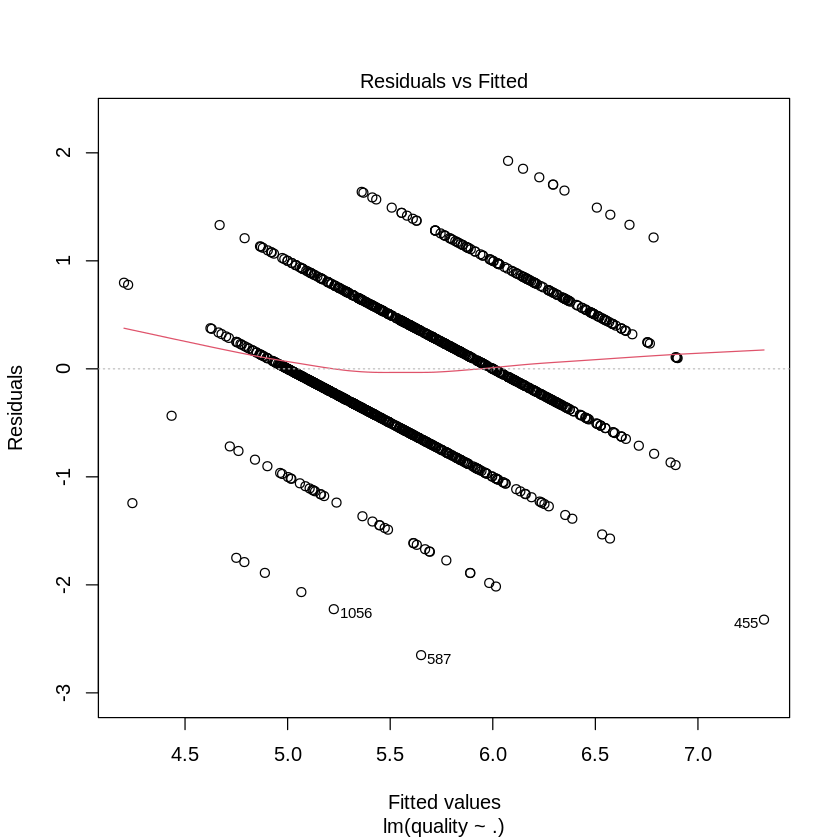

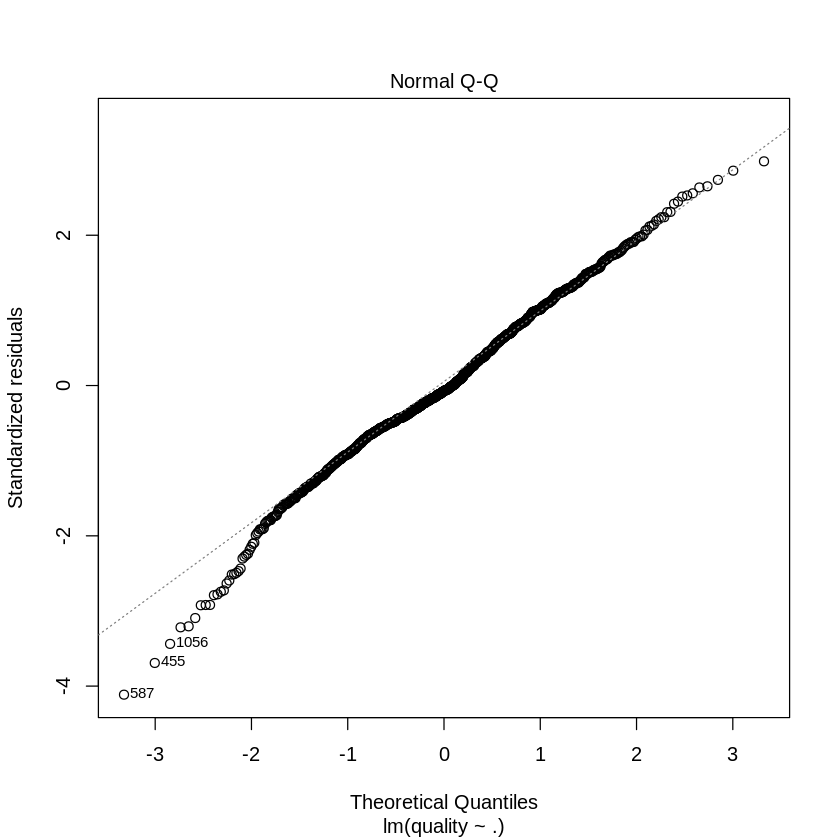

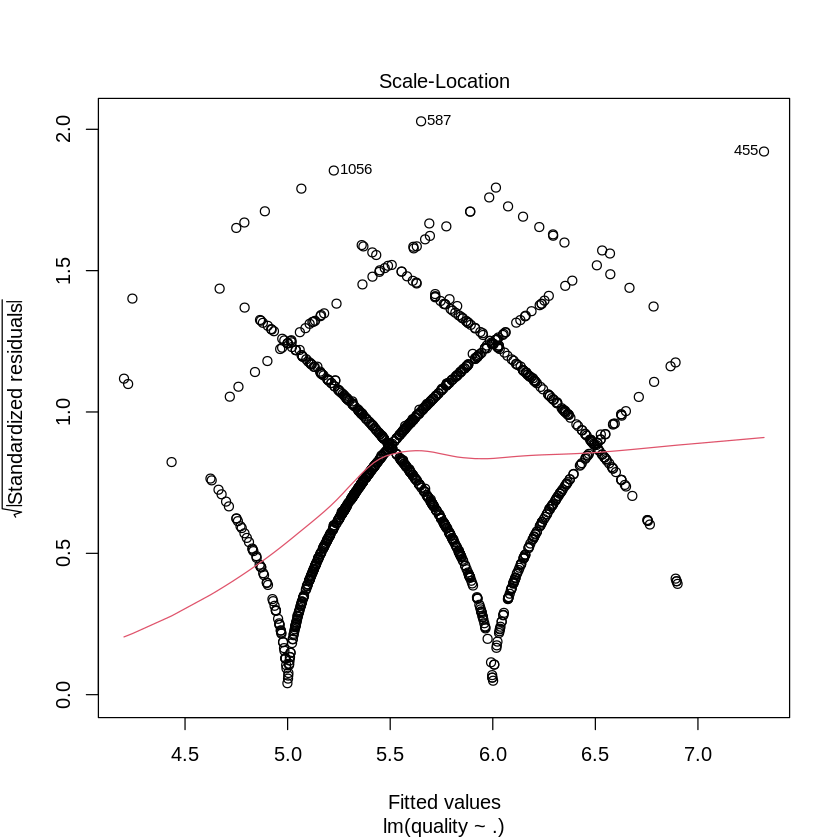

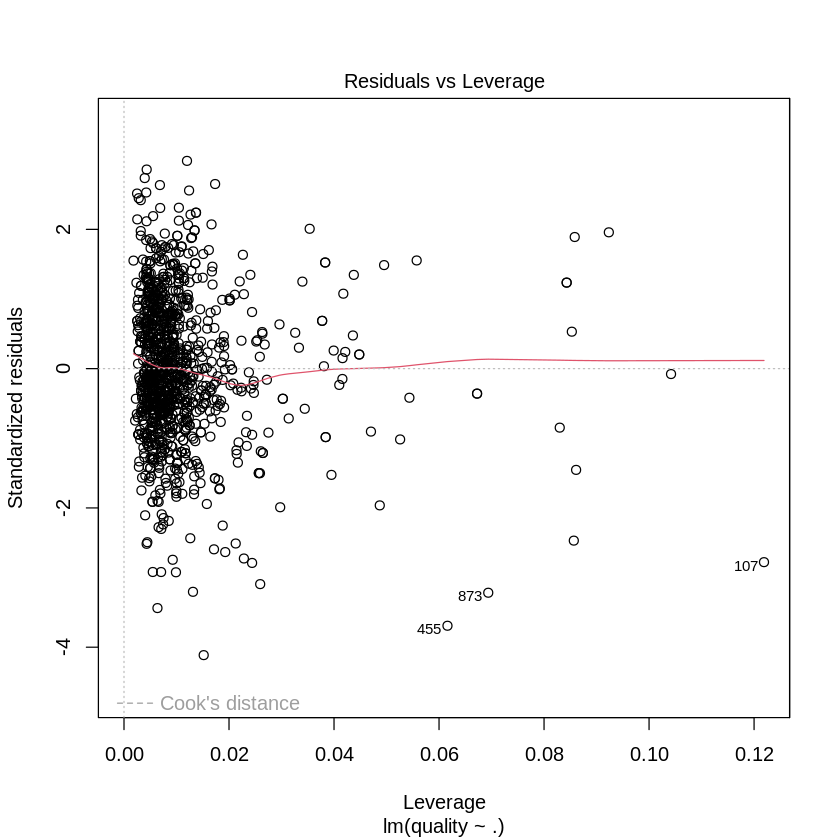

In [36]:
# Step 3: Model Evaluation
summary(model)
plot(model)

In [37]:
# Step 4: Model Validation
predictions <- predict(model, newdata = test)
mse <- mean((test$quality - predictions)^2)
rmse <- sqrt(mse)

In [38]:
rmse

[1] 0.6470923

In [39]:
mse

[1] 0.4187284

#### Refinement: backward selection

In [41]:
library(leaps)
wine_backward_sel <- regsubsets(
  quality ~ .,  # Replace 'quality' with your actual response variable
  data = train,
  nvmax = ncol(train) - 1,  # Assuming all other columns are predictors
  method = "backward"
)

# View the results
wine_backward_sel


Subset selection object
Call: regsubsets.formula(quality ~ ., data = train, nvmax = ncol(train) - 
    1, method = "backward")
11 Variables  (and intercept)
                       Forced in Forced out
`fixed acidity`            FALSE      FALSE
`volatile acidity`         FALSE      FALSE
`citric acid`              FALSE      FALSE
`residual sugar`           FALSE      FALSE
chlorides                  FALSE      FALSE
`free sulfur dioxide`      FALSE      FALSE
`total sulfur dioxide`     FALSE      FALSE
density                    FALSE      FALSE
pH                         FALSE      FALSE
sulphates                  FALSE      FALSE
alcohol                    FALSE      FALSE
1 subsets of each size up to 11
Selection Algorithm: backward

In [43]:
wine_bwd_summary <- summary(wine_backward_sel)

# Creating a dataframe with the summary metrics
wine_bwd_summary_df <- data.frame(
    n_input_variables = 1:(ncol(train) - 1),
    RSQ = wine_bwd_summary$rsq,
    RSS = wine_bwd_summary$rss,
    ADJ.R2 = wine_bwd_summary$adjr2
)

# View the summary dataframe
wine_bwd_summary_df

n_input_variables,RSQ,RSS,ADJ.R2
<int>,<dbl>,<dbl>,<dbl>
1,0.2164989,575.3206,0.2158025
2,0.3169364,501.5699,0.3157210
3,0.3340372,489.0129,0.3322581
4,0.3441647,481.5763,0.3418266
5,0.3526290,475.3610,0.3497415
6,0.3574398,471.8285,0.3539975
7,0.3587485,470.8675,0.3547371
8,0.3594909,470.3223,0.3549077
9,0.3597849,470.1065,0.3546265


In [44]:
wine_bwd_summary

Subset selection object
Call: regsubsets.formula(quality ~ ., data = train, nvmax = ncol(train) - 
    1, method = "backward")
11 Variables  (and intercept)
                       Forced in Forced out
`fixed acidity`            FALSE      FALSE
`volatile acidity`         FALSE      FALSE
`citric acid`              FALSE      FALSE
`residual sugar`           FALSE      FALSE
chlorides                  FALSE      FALSE
`free sulfur dioxide`      FALSE      FALSE
`total sulfur dioxide`     FALSE      FALSE
density                    FALSE      FALSE
pH                         FALSE      FALSE
sulphates                  FALSE      FALSE
alcohol                    FALSE      FALSE
1 subsets of each size up to 11
Selection Algorithm: backward
          `fixed acidity` `volatile acidity` `citric acid` `residual sugar`
1  ( 1 )  " "             " "                " "           " "             
2  ( 1 )  " "             "*"                " "           " "             
3  ( 1 )  " "            

#### The model with 8 variables (n_input_variables = 8) seems to be a good candidate. It has a relatively high Adjusted R-squared and includes volatile acidity, citric acid, chlorides, total sulfur dioxide, density, pH, sulphates, and alcohol.

In [47]:
final_model <- lm(quality ~ `volatile acidity` + `citric acid` + chlorides + `total sulfur dioxide` + density + pH + sulphates + alcohol, data = train)

In [48]:
tidy(final_model)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),3.26546946,1.401532e+01,0.2329928,8.158096e-01
`volatile acidity`,-1.22819738,1.402495e-01,-8.7572346,7.275601e-18
`citric acid`,-0.20332388,1.601297e-01,-1.2697450,2.044397e-01
chlorides,-1.85249882,4.590758e-01,-4.0352786,5.824702e-05
`total sulfur dioxide`,-0.00257391,6.174299e-04,-4.1687479,3.299345e-05
density,1.56014273,1.393598e+01,0.1119507,9.108826e-01
pH,-0.51112784,1.601592e-01,-3.1913745,1.455411e-03
sulphates,0.86907917,1.325197e-01,6.5581134,8.310242e-11
alcohol,0.28051860,2.442630e-02,11.4842869,6.174281e-29


In [49]:
predictions <- predict(final_model, newdata = test)
mse <- mean((test$quality - predictions)^2)
rmse <- sqrt(mse)

In [50]:
mse

[1] 0.4213955

In [51]:
rmse

[1] 0.6491498

### Visulize the result

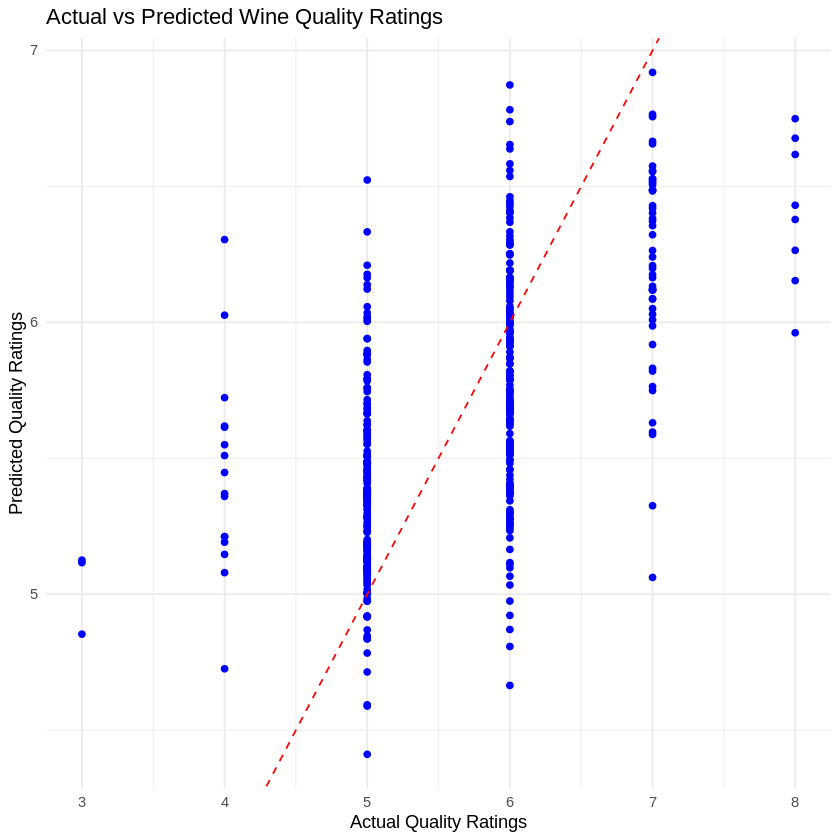

In [55]:
plot_df <- data.frame(Actual = test$quality, Predicted = predictions)

ggplot(plot_df, aes(x = Actual, y = Predicted)) +
    geom_point(color = "blue") +
    geom_abline(intercept = 0, slope = 1, color = "red", linetype = "dashed") +
    ggtitle("Actual vs Predicted Wine Quality Ratings") +
    xlab("Actual Quality Ratings") +
    ylab("Predicted Quality Ratings") +
    theme_minimal()


#Red Line: The red line represents the line of perfect prediction, where the actual quality ratings equal the predicted quality ratings. 
#Blue Points: The blue points in the plot are not a line, but individual points representing each observation in your dataset. 

### Interpretation: 
The final model's MSE of 0.4214 and RMSE of 0.6491 suggest a moderate level of predictive accuracy for the wine quality rating based on its chemical properties. Given the typical range of wine quality scores, these error values indicate that the model's predictions are reasonably close to the actual ratings, though there is room for improvement. Potential issues such as overfitting or multicollinearity should be investigated, especially given the complexity of the model with multiple predictors. To enhance model performance, techniques like cross-validation, feature selection refinement, or exploring non-linear relationships could be employed.